# Google Colab 

Change runtime to GPU!

In [ ]:
from google.colab import drive, files
drive.mount('/content/drive', force_remount=True)

In [ ]:
!pip install gdown

# create directory for storing data
!mkdir -p images

# download zip file with training set
!gdown https://drive.google.com/uc?id=1rTf4DJI2PoM-hgSSSzvpOQcQhui3qh-y && unzip -qq train.zip -d images
!rm train.zip

# download zip with valid set
!gdown https://drive.google.com/uc?id=1yB-KN--FjiWZrA6XwxaSvtXhtcbk80dQ && unzip -qq valid.zip -d images
!rm valid.zip

# download zip with utils
!gdown https://drive.google.com/uc?id=1LbwczJVpDLsMGS7yGMP7z1GCAMg4NCsS && unzip -qq utils.zip
!rm utils.zip

# change dir to the one with data 
!cd /content

In [ ]:
#!pip install -r requirements.txt --quiet

# Setup

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# plotting
import matplotlib.pyplot as plt

In [3]:
%matplotlib inline 
%config InlineBackend.figure_format = 'retina'

In [4]:
import numpy as np

import torch 
import torch.nn as nn

from torchvision import transforms

import os, time
from datetime import datetime 

from skimage.color import rgb2lab, lab2rgb
from skimage.io import imshow

from utils import get_random_file
from image_utils import preview_dataloader_lab, combine_channels
from dataloaders import ColorizationImageFolder
from dl_utils import *
from train import *
from models import *

In [5]:
print(torch.__version__)

1.3.1


In [6]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Running on {device}!')
custom_set_seed(42) # for reproducibility

Running on cpu!


In [ ]:
lab_version = 1 #tanh

# Model V0

Model based on the alpha model from here: https://blog.floydhub.com/colorizing-b-w-photos-with-neural-networks/

**Define parameters**

In [6]:
# data loaders
BATCH_SIZE = 32 
IMG_SIZE = 224

# model
save_images = True
epochs = 10
print_every = 1
save_every = 20

# make output folders
OUTPUT_PATH = f'v0_lab{lab_version}_outputs'
CHECKPOINTS_PATH = f'v0_lab{lab_version}_checkpoints'

os.makedirs(f'{OUTPUT_PATH}/color', exist_ok=True)
os.makedirs(f'{OUTPUT_PATH}/gray', exist_ok=True)
os.makedirs(f'{CHECKPOINTS_PATH}', exist_ok=True)

## DataLoaders

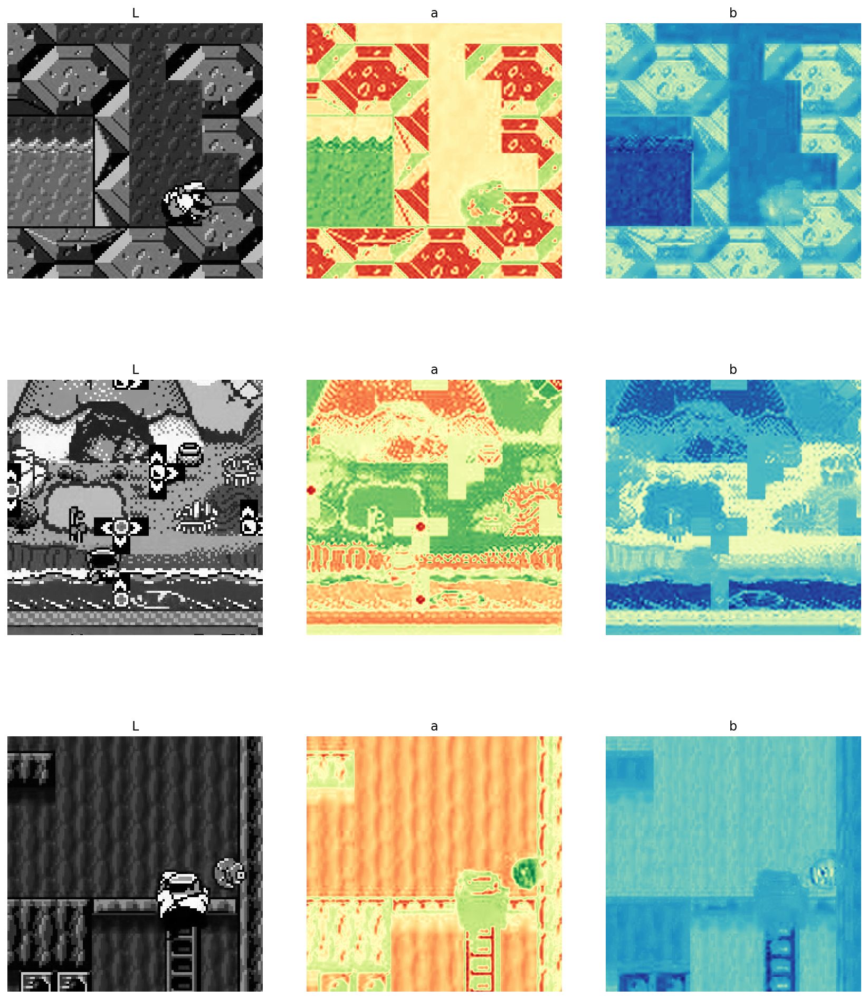

In [7]:
# define transformations
train_transforms = transforms.Compose([
    transforms.RandomCrop(IMG_SIZE),
    transforms.RandomHorizontalFlip(p=0.5)
])

valid_transforms = transforms.Compose([
    transforms.CenterCrop((IMG_SIZE, IMG_SIZE))
])

# image folders
train_folder = ColorizationImageFolder(root='images/train', 
                                       lab_version=lab_version, 
                                       transform=train_transforms)
valid_folder = ColorizationImageFolder(root='images/valid', 
                                       lab_version=lab_version, 
                                       transform=valid_transforms)

# image loaders 
train_loader = torch.utils.data.DataLoader(train_folder, 
                                           batch_size=BATCH_SIZE, 
                                           shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_folder, 
                                           batch_size=BATCH_SIZE, 
                                           shuffle=False)

# preview the images
#img_gray, img_ab = preview_dataloader_lab(train_loader)

## Model

In [8]:
model = ColorCNN_v0(lab_version=lab_version).to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.RMSprop(model.parameters(), lr=0.001)

In [9]:
model

ColorCNN_v0(
  (relu): ReLU()
  (final): Tanh()
  (upsampling): Upsample()
  (conv1): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(16, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv5): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(32, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv7): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv8): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv9): Conv2d(16, 2, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (color): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): Conv2d(8, 16, kernel_size=(3

## Training

In [14]:
 model, optimizer, losses = training_loop(model, criterion, optimizer, train_loader, 
                                          valid_loader, epochs, device, 
                                          save_dir=CHECKPOINTS_PATH, 
                                          save_every=save_every, 
                                          print_every=print_every)

KeyboardInterrupt: 

## Evaluation

In [ ]:
show_model_results(model, 
                   model_name='Model V0', 
                   lab_version=lab_version, 
                   path=get_random_file('images/train/wario/', 'jpg'), 
                   img_size=IMG_SIZE, 
                   device=device)

## Download checkpoints from Colab

In [ ]:
!zip checkpoints_v0.zip v0_checkpoints

In [ ]:
# save files if in Google Colab
files.download('checkpoints.zip')

# Model V1

Model based on the beta model from here: https://blog.floydhub.com/colorizing-b-w-photos-with-neural-networks/

**Define parameters**

In [7]:
# data loaders
BATCH_SIZE = 32 
IMG_SIZE = 224

# model
save_images = True
epochs = 10
print_every = 1
save_every = 20

# make output folders
OUTPUT_PATH = f'v1_lab{lab_version}_outputs'
CHECKPOINTS_PATH = f'v1_lab{lab_version}_checkpoints'

os.makedirs(f'{OUTPUT_PATH}/color', exist_ok=True)
os.makedirs(f'{OUTPUT_PATH}/gray', exist_ok=True)
os.makedirs(f'{CHECKPOINTS_PATH}', exist_ok=True)

## DataLoaders

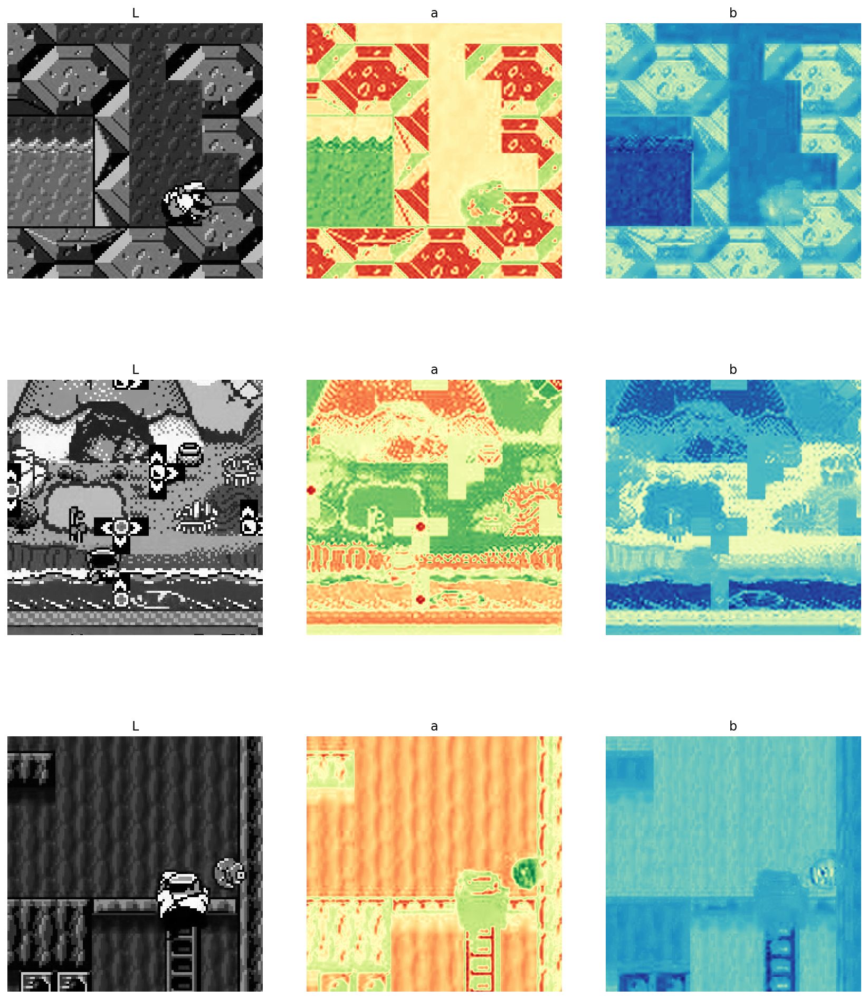

In [8]:
# define transformations
train_transforms = transforms.Compose([
    transforms.RandomCrop(IMG_SIZE),
    transforms.RandomHorizontalFlip(p=0.5)
])

valid_transforms = transforms.Compose([
    transforms.CenterCrop((IMG_SIZE, IMG_SIZE))
])

# image folders
train_folder = ColorizationImageFolder(root='images/train', 
                                       lab_version=lab_version, 
                                       transform=train_transforms)
valid_folder = ColorizationImageFolder(root='images/valid', 
                                       lab_version=lab_version, 
                                       transform=valid_transforms)

# image loaders 
train_loader = torch.utils.data.DataLoader(train_folder, 
                                           batch_size=BATCH_SIZE, 
                                           shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_folder, 
                                           batch_size=BATCH_SIZE, 
                                           shuffle=False)

# preview the images
#img_gray, img_ab = preview_dataloader_lab(train_loader)

## Model

In [9]:
model = ColorCNN_v1(lab_version=lab_version).to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.RMSprop(model.parameters(), lr=0.001)

In [10]:
model

ColorCNN_v1(
  (relu): ReLU()
  (final): Tanh()
  (upsampling): Upsample()
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv7): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv8): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv9): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv10): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv11): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv12): Conv2d(32, 2, kernel_size=(3, 3), stride=(1, 1), pa

## Training

In [ ]:
 model, optimizer, losses = training_loop(model, criterion, optimizer, train_loader, 
                                          valid_loader, epochs, device, 
                                          save_dir=CHECKPOINTS_PATH, 
                                          save_every=save_every, 
                                          print_every=print_every)

## Evaluation

In [ ]:
show_model_results(model, 
                   model_name='Model V1', 
                   lab_version=lab_version, 
                   path=get_random_file('images/train/wario/', 'jpg'), 
                   img_size=IMG_SIZE, 
                   device=device)

## Download checkpoints from Colab

In [ ]:
!zip checkpoints_v1.zip v1_checkpoints

In [ ]:
# save files if in Google Colab
files.download('checkpoints.zip')

# Model V1 - small

The model was taking a very long time to train, so I retained the structure of V1, but divided the number the channels by 2 to make the network smaller. Hopefully, it will work just fine.

**Define parameters**

In [7]:
# data loaders
BATCH_SIZE = 32 
IMG_SIZE = 224

# model
save_images = True
epochs = 10
print_every = 1
save_every = 20

# make output folders
OUTPUT_PATH = f'v1_small_lab{lab_version}_outputs'
CHECKPOINTS_PATH = f'v1_small_lab{lab_version}_checkpoints'

os.makedirs(f'{OUTPUT_PATH}/color', exist_ok=True)
os.makedirs(f'{OUTPUT_PATH}/gray', exist_ok=True)
os.makedirs(f'{CHECKPOINTS_PATH}', exist_ok=True)

## DataLoaders

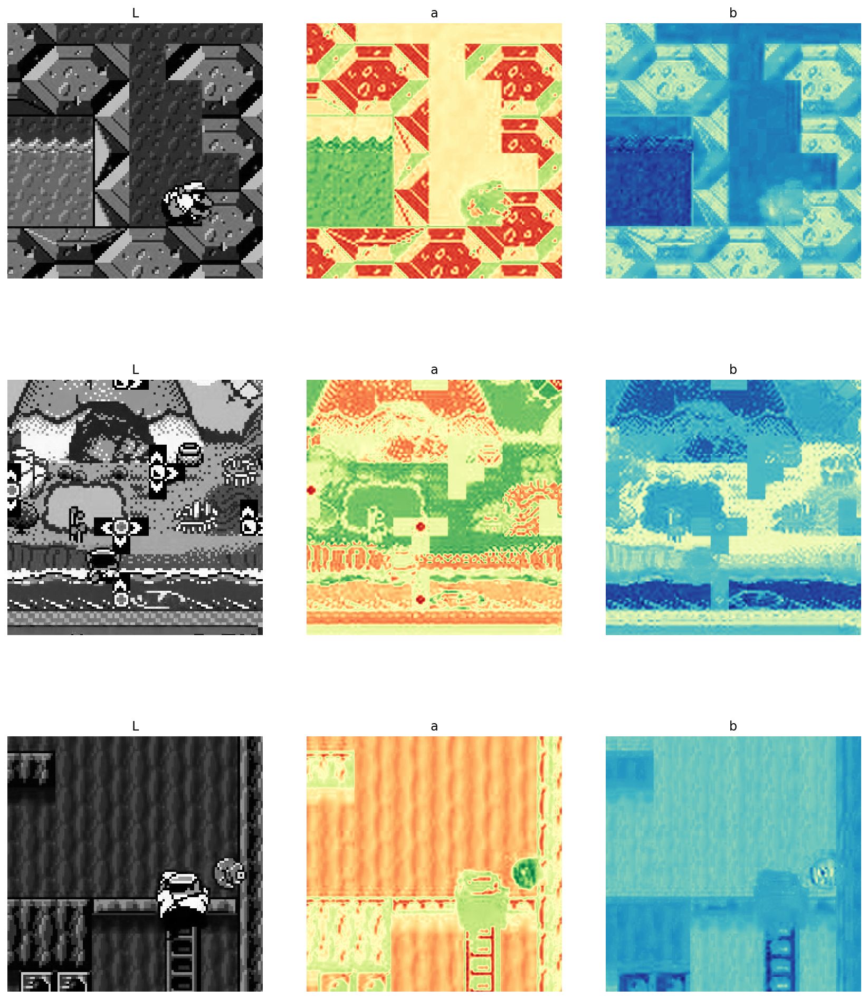

In [8]:
# define transformations
train_transforms = transforms.Compose([
    transforms.RandomCrop(IMG_SIZE),
    transforms.RandomHorizontalFlip(p=0.5)
])

valid_transforms = transforms.Compose([
    transforms.CenterCrop((IMG_SIZE, IMG_SIZE))
])

# image folders
train_folder = ColorizationImageFolder(root='images/train', 
                                       lab_version=lab_version, 
                                       transform=train_transforms)
valid_folder = ColorizationImageFolder(root='images/valid', 
                                       lab_version=lab_version, 
                                       transform=valid_transforms)

# image loaders 
train_loader = torch.utils.data.DataLoader(train_folder, 
                                           batch_size=BATCH_SIZE, 
                                           shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_folder, 
                                           batch_size=BATCH_SIZE, 
                                           shuffle=False)

# preview the images
#img_gray, img_ab = preview_dataloader_lab(train_loader)

## Model

In [9]:
model = ColorCNN_v1_small(lab_version=lab_version).to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.RMSprop(model.parameters(), lr=0.001)

In [10]:
model

ColorCNN_v1(
  (relu): ReLU()
  (final): Tanh()
  (upsampling): Upsample()
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv4): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv6): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (conv7): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv8): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv9): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv10): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv11): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv12): Conv2d(32, 2, kernel_size=(3, 3), stride=(1, 1), pa

## Training

In [ ]:
 model, optimizer, losses = training_loop(model, criterion, optimizer, train_loader, 
                                          valid_loader, epochs, device, 
                                          save_dir=CHECKPOINTS_PATH, 
                                          save_every=save_every, 
                                          print_every=print_every)

## Evaluation

In [ ]:
show_model_results(model, 
                   model_name='Model V1', 
                   lab_version=lab_version, 
                   path=get_random_file('images/train/wario/', 'jpg'), 
                   img_size=IMG_SIZE, 
                   device=device)

## Download checkpoints from Colab

In [ ]:
!zip checkpoints_v1.zip v1_checkpoints

In [ ]:
# save files if in Google Colab
files.download('checkpoints.zip')

# Model V2

Model based on the model from here: https://lukemelas.github.io/image-colorization.html

**Define parameters**

In [7]:
# data loaders
BATCH_SIZE = 32 
IMG_SIZE = 224

# model
save_images = True
epochs = 10
print_every = 1
save_every = 20

# make output folders
OUTPUT_PATH = f'v2_lab{lab_version}_outputs'
CHECKPOINTS_PATH = f'v2_lab{lab_version}_checkpoints'

os.makedirs(f'{OUTPUT_PATH}/color', exist_ok=True)
os.makedirs(f'{OUTPUT_PATH}/gray', exist_ok=True)
os.makedirs(f'{CHECKPOINTS_PATH}', exist_ok=True)

## DataLoaders

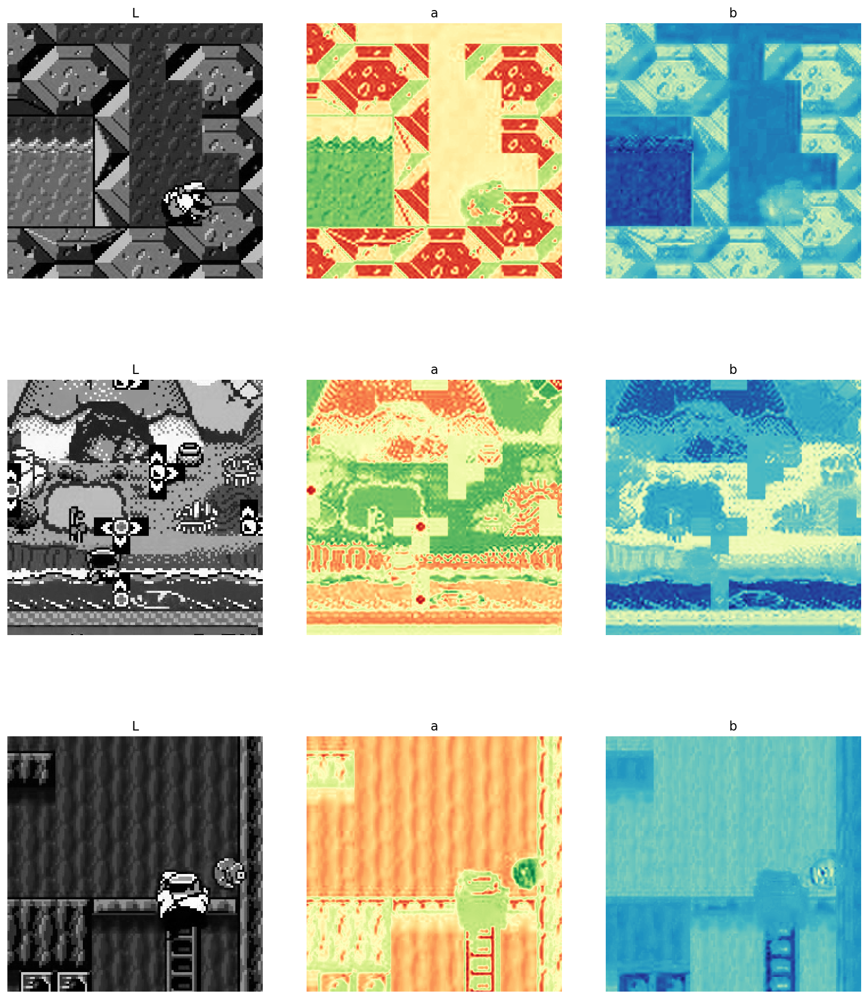

In [8]:
# define transformations
train_transforms = transforms.Compose([
    transforms.RandomCrop(IMG_SIZE),
    transforms.RandomHorizontalFlip(p=0.5)
])

valid_transforms = transforms.Compose([
    transforms.CenterCrop((IMG_SIZE, IMG_SIZE))
])

# image folders
train_folder = ColorizationImageFolder(root='images/train', 
                                       lab_version=lab_version, 
                                       transform=train_transforms)
valid_folder = ColorizationImageFolder(root='images/valid', 
                                       lab_version=lab_version, 
                                       transform=valid_transforms)

# image loaders 
train_loader = torch.utils.data.DataLoader(train_folder, 
                                           batch_size=BATCH_SIZE, 
                                           shuffle=True)
valid_loader = torch.utils.data.DataLoader(valid_folder, 
                                           batch_size=BATCH_SIZE, 
                                           shuffle=False)

# preview the images
img_gray, img_ab = preview_dataloader_lab(train_loader)

## Model

In [9]:
model = ColorCNN_v2(lab_version=lab_version).to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-2, weight_decay=0.0)

In [10]:
model

ColorCNN_v2(
  (final): ReLU()
  (midlevel_resnet): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=T

## Training

In [11]:
 model, optimizer, losses = training_loop(model, criterion, optimizer, train_loader, 
                                          valid_loader, epochs, device, 
                                          save_dir=CHECKPOINTS_PATH, 
                                          save_every=save_every, 
                                          print_every=print_every)

KeyboardInterrupt: 

## Evaluation

In [ ]:
show_model_results(model, 
                   model_name='Model V2', 
                   lab_version=lab_version, 
                   path=get_random_file('images/train/wario/', 'jpg'), 
                   img_size=IMG_SIZE, 
                   device=device)

## Download checkpoints from Colab

In [ ]:
!zip checkpoints_v1.zip v1_checkpoints

In [ ]:
# save files if in Google Colab
files.download('checkpoints.zip')